In [1]:
import struct
import os
import gc
import pickle
from scapy.all import *
from multiprocessing import Pool
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# import plotly.io as pio
# pio.renderers.default = 'sphinx_gallery'

def epoch_s_to_ns(epoch_s):
    return epoch_s * 1e9

def ms_to_epoch(ms):
    return ms / 1e3

def epoch_to_ms(epoch):
    return epoch * 1e3

In [2]:
efu_data_folder = r'efu_data_231003'
ipc_data_folder = r'ipc_data_231003'

tdc_file = "all_tdc_pkt.tpx3"
evr_file = "all_evr_pkt.tpx3"

with open(os.path.join(efu_data_folder, tdc_file), 'rb') as reader:
    all_efu_tdc = pickle.load(reader)

with open(os.path.join(efu_data_folder, evr_file), 'rb') as reader:
    all_efu_evr = pickle.load(reader)
    
with open(os.path.join(ipc_data_folder, tdc_file), 'rb') as reader:
    all_ipc_tdc = pickle.load(reader)

with open(os.path.join(ipc_data_folder, evr_file), 'rb') as reader:
    all_ipc_evr = pickle.load(reader)

In [3]:
#Drop corrupted EVR information (unrealistic counter)
all_efu_evr = all_efu_evr.drop(all_efu_evr[all_efu_evr['Counter'] > 5000].index, axis=0)
all_efu_evr.reset_index(inplace=True, drop=True)

In [4]:
evr_df = all_efu_evr.copy()

In [5]:
evr_df['PacketDiff'] = evr_df['Readout'].diff(periods=1)
fig1 = px.area(evr_df['PacketDiff'].iloc[1000:1050])
fig1.update_layout(go.Layout(title="Figure 1: Other packets btw. EVR's",
                            xaxis=dict(title="Readout diff from previous EVR"),
                            yaxis=dict(title="Data index")))
print()

In [6]:
frenquency = 0

evr_df['PulseTimeDiff'] = (epoch_s_to_ns(evr_df['PulseTimeSeconds']) + evr_df['PulseTimeNanoSeconds']) \
                        - (epoch_s_to_ns(evr_df['PrevPulseTimeSeconds']) + evr_df['PrevPulseTimeNanoSeconds'])

evr_df['Frequency'] = 1 / (evr_df['PulseTimeDiff'] / 1e9)

evr_df['PulseTimeDiff'].mask(evr_df['PulseTimeDiff'] > 1e10 , -1, inplace=True)

diff_fig = go.Figure()
diff_fig.add_trace(
    go.Bar(x=evr_df.index.values.tolist(), y=evr_df['PulseTimeDiff']
           .values.tolist(), name='PulseTimeDiff (ns)')
)

freq_fig = go.Figure()
freq_fig.add_trace(
    go.Bar(x=evr_df.index.values.tolist(), y=evr_df['Frequency']
           .values.tolist(), name='Frequency (Hz)')
)

frequency = evr_df['Frequency'].mean()

In [7]:
tdc_timediff = all_efu_tdc.copy()

tdc_timediff["CTimeDiff"] = tdc_timediff["CTime"].diff(periods=1)
tdc_timediff['CTimeDiff'].mask(tdc_timediff['CTimeDiff'] < 0 ,0, inplace=True)

# tdc_df["CTimeDiff"].hist()

fig3 = go.Figure()
fig3.add_trace(
    go.Bar(x=tdc_timediff['Readout'],
           y=tdc_timediff["CTimeDiff"].apply(lambda x: x/1e5).values.tolist(),
           name='CTimeDiff (1e5 ns)',
           marker=dict(color='Orange', line=dict(color='Orange', width=2)))
)
fig3.add_trace(
    go.Scatter(x=tdc_timediff['Readout'], 
               y=tdc_timediff["CTime"].apply(lambda x: x/ (5*1e7)).values.tolist(), 
               name='TDC CTime (5*1e7 ns)',
               mode='lines+markers')
)
fig3.add_trace(
    go.Scatter(x=tdc_timediff['Readout'],
               y=tdc_timediff["Tcounter"],
               name='TDC Counter',
               mode='lines+markers')
)

layout = go.Layout(
        title='Figure 3: TDC dataframes recorded on the EFU',
        xaxis=dict(
             title='Readouts',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Value for each Readout per category',
        
        autorange=True
    )
    )

print()

In [8]:
tdc_timediff = all_ipc_tdc.copy()

tdc_timediff["CTimeDiff"] = tdc_timediff["CTime"].diff(periods=1)
tdc_timediff['CTimeDiff'].mask(tdc_timediff['CTimeDiff'] < 0 ,0, inplace=True)

# tdc_df["CTimeDiff"].hist()

fig4 = go.Figure()
fig4.add_trace(
    go.Bar(x=tdc_timediff['Readout'],
           y=tdc_timediff["CTimeDiff"].apply(lambda x: x/1e5).values.tolist(),
           name='CTimeDiff (1e5 ns)',
           marker=dict(color='Orange', line=dict(color='Orange', width=2)))
)
fig4.add_trace(
    go.Scatter(x=tdc_timediff['Readout'], 
               y=tdc_timediff["CTime"].apply(lambda x: x/ (5*1e7)).values.tolist(), 
               name='TDC CTime (5*1e7 ns)',
               mode='lines+markers')
)
fig4.add_trace(
    go.Scatter(x=tdc_timediff['Readout'],
               y=tdc_timediff["Tcounter"],
               name='TDC Counter',
               mode='lines+markers')
)

layout = go.Layout(
        title='Figure 4: TDC dataframes recorded on IPC before iptables',
        xaxis=dict(
             title='Readouts',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Value for each Readout per category',
        
        autorange=True
    )
    )

fig4.update_layout(layout)

print()

In [9]:
evr_df = all_efu_evr.copy()
tdc_df = all_efu_tdc.copy()

fig5 = go.Figure()

fig5.add_trace(
    go.Scatter(x=evr_df['Readout'], y=evr_df["Counter"], name='EVR counter')
)

fig5.add_trace(
    go.Scatter(x=tdc_df['Readout'], y=tdc_df["Tcounter"], name='TDC Counter')
)

layout = go.Layout(
        title='Figure 5: TDC and EVR counters started at the same time from zero',
        xaxis=dict(
             title='Readouts',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Counter value',
        
        autorange=True
    )
    )

fig5.update_layout(layout)

print()

In [10]:
tdc_evr = pd.concat([tdc_timediff[['Readout', 'PacketId', 'Type','CTimeDiff', 'Tcounter']], 
                     evr_df[['Readout', 'PacketId', 'Type', 'Counter']]], ignore_index=True)
tdc_evr = tdc_evr.sort_values(by='Readout', ignore_index=True)

fig6 = go.Figure()
fig6.add_trace(
    go.Bar(x=tdc_evr[tdc_evr["Type"] == "EVR"]["Readout"], 
           y=tdc_evr[tdc_evr["Type"] == "EVR"]["Counter"], name="EVR")
)
fig6.add_trace(
    go.Bar(x=tdc_evr[tdc_evr["Type"] == "TDC"]["Readout"], 
           y=tdc_evr[tdc_evr["Type"] == "TDC"]["Tcounter"], name="TDC")
)
fig6.add_trace(
    go.Bar(x=tdc_evr[tdc_evr["Type"] == "TDC"]["Readout"], 
               y=tdc_evr[tdc_evr["Type"] == "TDC"]["CTimeDiff"]
               .apply(lambda x: 0 if x == 0 else x/1e5-1000),
               name='CTimeDiff',
               marker=dict(color='Black', line=dict(color='Black', width=2))))

layout = go.Layout(
        title='Figure 6: TDC and EVR packets in order of arrival',
        xaxis=dict(
             title='Readouts',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Counter value',
        
        autorange=True
    )
    )

fig6.update_layout(layout)

print()

In [11]:
evr_events = all_efu_evr.copy()
tdc_events = all_efu_tdc.copy()

tdc_evr_pairs = []
evr_alone = []

# frequency is calculated earlier in this model
for evr_event in evr_events['ReadoutTime']:
    tdc_pair = tdc_events[(tdc_events['ReadoutTime'] >= evr_event - ms_to_epoch(frequency/2)) &
                         (tdc_events['ReadoutTime'] <= evr_event + ms_to_epoch(frequency/2))]
    if(tdc_pair.empty):
        evr_alone.append(evr_events[evr_events['ReadoutTime'] == evr_event].iloc[0])
        continue

    evr_event = evr_events[evr_events['ReadoutTime'] == evr_event]
    
    tdc_evr_pairs.append({
        'EVR_Readout': evr_event.iloc[0]['Readout'],
        'EVR_PacketId': evr_event.iloc[0]['PacketId'],
        'EVR_ReadoutTime': evr_event.iloc[0]['ReadoutTime'],
        'EVR_Counter': evr_event.iloc[0]['Counter'],
        
        'TDC_Readout': tdc_pair.iloc[0]['Readout'],
        'TDC_PacketId': tdc_pair.iloc[0]['PacketId'],
        'TDC_ReadoutTime': tdc_pair.iloc[0]['ReadoutTime'],
        'TDC_Counter': tdc_pair.iloc[0]['Tcounter']
    })

tdc_evr_pairs = pd.DataFrame.from_records(tdc_evr_pairs)
evr_alone = pd.DataFrame.from_records(evr_alone)
tdc_evr_pairs['CounterDiff'] = tdc_evr_pairs['EVR_Counter'] - tdc_evr_pairs['TDC_Counter']
tdc_evr_pairs['TDCDelayToEVR'] = epoch_to_ms(tdc_evr_pairs['TDC_ReadoutTime'] - tdc_evr_pairs['EVR_ReadoutTime'])

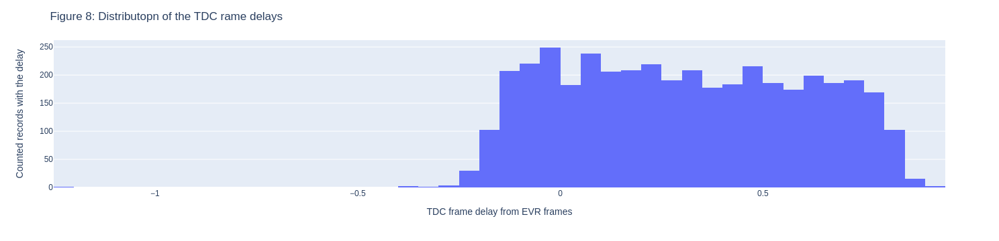

In [12]:
fig8 = px.histogram(tdc_evr_pairs, x="TDCDelayToEVR")
fig8.update_layout(go.Layout(
        title='Figure 8: Distributopn of the TDC rame delays',
        xaxis=dict(
             title='TDC frame delay from EVR frames',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Counted records with the delay',
        
        autorange=True
    )
    )
                  )

In [13]:
fig7 = go.Figure()
fig7.add_trace(
    go.Bar(x=tdc_evr_pairs["EVR_Readout"], 
           y=tdc_evr_pairs["EVR_Counter"],
           name="EVR")
)
fig7.add_trace(
    go.Bar(x=tdc_evr_pairs["EVR_Readout"], 
           y=tdc_evr_pairs["TDC_Counter"],
           name="TDC")
)
fig7.add_trace(
    go.Bar(x=evr_alone["Readout"], 
           y=evr_alone["Counter"],
           name="No TDC pair",
           marker=dict(color='Black', line=dict(color='Black', width=2)))
)

layout = go.Layout(
        title='Figure 7: Identified EVR+TDC pairs by arrival time',
        xaxis=dict(
             title='EVR packet id',
             
        autorange=True,
        
    ),
    hovermode='closest',
    yaxis=dict(
        title='Counter status',
        
        autorange=True
    )
    )

fig7.update_layout(layout)
print()

# Report on Timpix camera TDC and EVR packets received by EFU

This report aims to identify the behaviour and netaure of the udp data receiwed by the EFU from the timepix campera and ESS EVR (timing) system.

## Current system setup

The Timpix camera is connected to an industrial PC (IPC) through a 10Gbps networking interface which also runs the IOC software for the EVR ESS timing system. Both the camera and the EVR IOC is producing UDP packets which then received by the IPC networking stack. The camer

The IPC has an iptables configuration which aims to capture these UDP streams and forward them to the EFU with the same UPD port address **9888**. This means the iptables configuration owerwrites the UPD port address in both datastream to forwrd them to a common port on the EFU.

Further links:
* **YMIR TIMEPIX setup**: https://confluence.esss.lu.se/display/IS/TPX3+-+Time+stamping+and+data+pipeline+to+EFU+and+Serval

## Description of the receiwed data types

* **PIXEL**: This frame contains information about the activate pixel position and activation time and also a timestamp from the internal clock status. This is produced by the camera and one UDP packet can hold multiple PIXEL frames.
* **TDC**: This frame contains timestamp from the internal clock at the time when TTL time pulse signal (from EVR) reived. Furthermore it has a 12bit counter which is increased every time a new TTL pulse received. This is produced by the camera and it's comes merged together with pixel frames in camera UDP packets.
* **EVR**: This frame contains information about the EVR ESS timestamp (pulse time) and also the previous pulse timestamp. Furthermore it has a 64bit counter shich increased for each EVR pulse. This is produced by the EVR system and it comes within it's own separate UDP packet.

## Data recording for analysis

To create this report I recorded data in two points on this data pipeline:
* from IPC network card from port 8192 to record data directly comming from the camera.
* from the EFU incoming network card on port 9888 to record the merged UDP stream from camera and the EVR.

* **Packet routing for Timepix**: https://confluence.esss.lu.se/display/IS/Packet+routing+config

I executed the follwing steps during the recording:
**Precondition**: EVR IOC and camera stopped and make sure their pulse counters are reset to 0
1. Start tcpdump recording on IPC and EFU
1. Start camera recording with to product pixel and timing data.
1. Start the EVR IOC to produce timing pulses for the camera and also UDP messages to the EFU

### Processing data

The recording was done with PCAP files which then transformed into pandas DataFrames for further analysis. I used two counter during processing the pcap files:
* **RedoutCounter**: This counter implemented for each frame (PXEL,TDC or EVR) we processed and stored into dataframes.
* **PacketCounter**: This counter incremented each time we processed a new UDP packet from either from Camera or EVR.

The current status of this counter was added to each data record as well as the EPOCH timestamp from the PCAP file. By this **Readout** are uniq identifiers for each record and they are increased in the same order as I found the data in the pcap file. **PacketId** and **PacketTimestamp** are not uniq but they are also wollow the pcap processing orders.

**Note:** *During the analysis I only worked with EVR and processed the TDC and EVR packets and skipped PIXEL to increase processing time. This resulted in that I looped through each each UDP packet and I count them but I registered Readout only when I found TDC or EVR packets. Since on our operating frequency only one TDC is part of an UDP frame from the camera this means: ___the Readout counter also identifies the UDP packet which is relevant for our report. I will use Readout instead of packet ID during the report___

## Results of the Analysis

### Analyse packets received btw. EVR packets

For each EVR I calculated the difference between the current and the previous EVR packets **Readout**. Since only EVR and TDC frames are processed, and both comes in their separate UDP the **Readout** actually acts as packet identification. According to the documentation I expect that 1 TDC packet between each EVR so the **Readout** difference should be **2**.

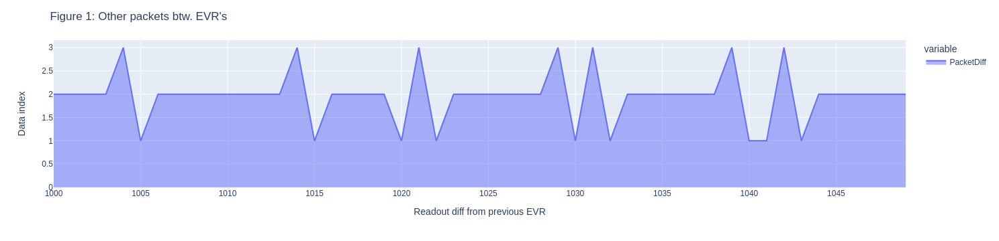

In [14]:
fig1.show()

**Result**: From my test data I can see that most of the time the difference is **2** according to the expectation, but time to time it's increased to **3** and then right after to **1**. The situation when we have 3 and then 1 is an event when we received either the EVR or the TDC delayed and it was arried between the next EVR gap. However there have 1-3-1 and 3-1-1 events which are signs of packet loss ofthe TDC packets.

### EVR packet frequency

The following chart the time difference of the EVR clock (previous and current timestamp) for each EVR frame. I convert this into frequency and it clarly visible that the EVR is operating with:

In [15]:
print(f"{frequency} Hz frequency")

9.99766910718873 Hz frequency


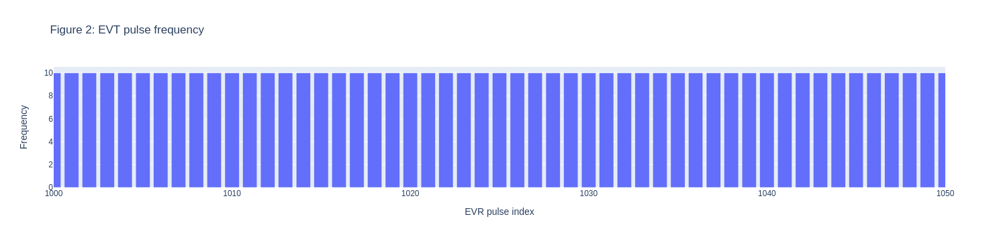

In [16]:
freq_fig.update_layout(go.Layout(title="Figure 2: EVT pulse frequency",
                                 xaxis=dict(title="EVR pulse index", autorange=False, range=[1000, 1050]),
                                 yaxis=dict(title='Frequency')))
freq_fig.show()

### Study TDC frames

TDC frames are produced by the camera every time the camera received TTL pulse from EVR system. The TDC frame contained a counter called **TDC counter** which increased for each pulse and which has 12bit size (4096 counts) and the clock timestamp from it's internal clock which I named az **CTime** in the records.

I also calculated the the **CTimeDiff** for each record, which is the clock difference between the current and previous TDC frame.

I created a merged graph where I scaled each data into a range where I can display them in relative to each other.
* **CTimeDiff**: shows the clock time difference between two TDC pulse. Since we run on 10Hz the scaled calue should be on 1000.
* **TDC CTime**: is the clock timestamp for each record. This value also scaled down with 5*1e7.
* **TDC Counter**: this is the counter value for each record.

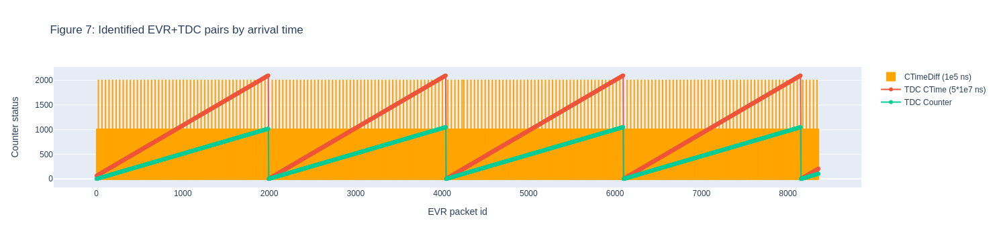

In [17]:
fig3.update_layout(layout)
fig3.show()

According to our chart we can notice the followings:
* The CTime and the Counter is reseted in the same times and multiple time during our data record.
* The CTime difference between our records are sometimes doubled, which  are

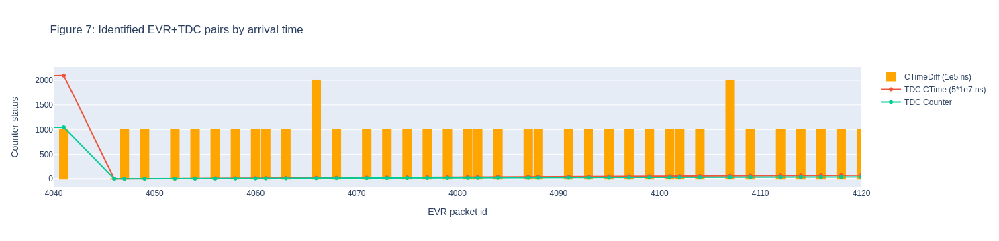

In [18]:
layout2 = go.Layout(xaxis=dict(autorange=False, range=[4040, 4120]))
fig3.update_layout(layout2)
fig3.show()

With a better zoom on the record 4003 we can see the following:
* Ctime field and thye counter is reset in the same to inital value **1** in case of the Counter. Also that this happens before the counter reach the maximum value of 12bit (4086) the reset happens arround **Counter = 1049**.
* The Ctime difference between TDC packets time to time double, which indicate that we lost packets. If we look the following chart then it's visible that the counter increased from 1028 to 1030 means **we lost TDC with 1029**

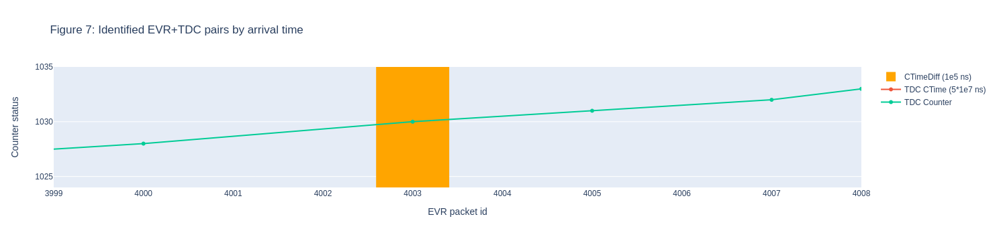

In [19]:
layout2 = go.Layout(xaxis=dict(autorange=False, range=[3999, 4008]),
                   yaxis=dict(autorange=False, range=[1024, 1035]))
fig3.update_layout(layout2)
fig3.show()

**Compare the TDC frames recorded on the IPC:**

The follwing data was recoeded on the IPC's camera side network card, therefore it shows the incoming data directly from the camera. According to the figures below we have the same behaviour as we experienced on the EFU side, namely that we frequently lost TDC packets and the CTime diff doubled and we can see that counter incremented by rwo in certain cases.

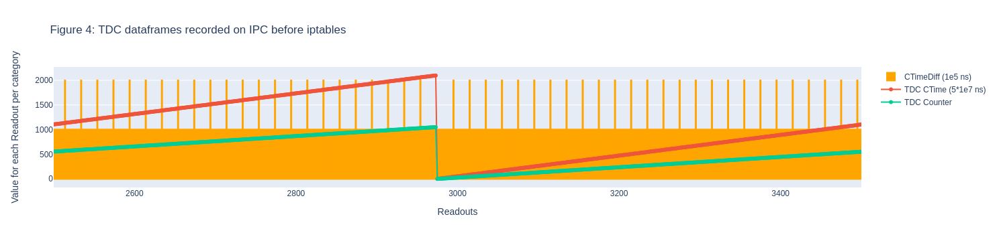

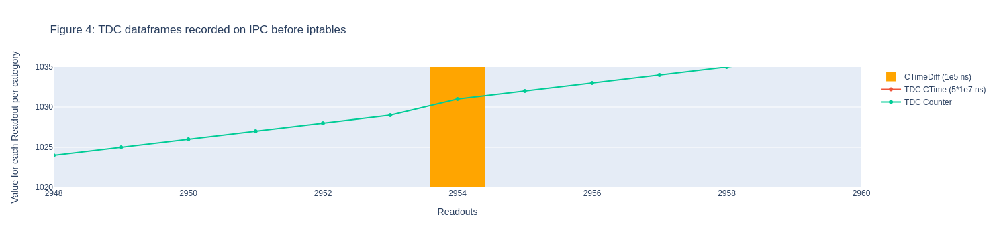

In [20]:
fig4.update_layout(go.Layout(xaxis=dict(autorange=False, range=[2500, 3500])))
fig4.show()

fig4.update_layout(go.Layout(xaxis=dict(autorange=False, range=[2948, 2960]),
                   yaxis=dict(autorange=False, range=[1020, 1035])))
fig4.show()

## Comparison on TDC and EVR frames

### Counters

The following figure compares the TDC and EVR counters. While EVR follwing the 12bit like behaviour and count from 1-4095 and resets after, the **as we identified before, TDC resets according to his internal clock, more frequently. Since the TDC counter not resets after the 12bit field is full there is no way to syncronize the two counters.**

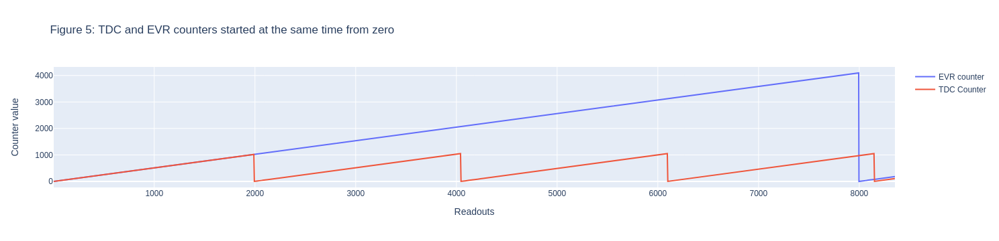

In [21]:
fig5.show()

***Note:*** *The current implementation of the 12 bit like EVR counter is incorrect, because it should finish the 4096 istead of 4095 and it should restart at 1 and not at 0.*

### TDC and EVR according to arrival

The followng figure merges TDC and EVR packets ordered by their readout, means that technically the visualizations shows them in their order of arrival. On the **y** axis we can see teir counter status. The record focus to moment where we can see 3 trend:
1. **TDC frame comes first**: when red column comes first and then a blue withthe same height is the expected behaviour, where  TDC arriwes first and in the next packet we receive the EVR with the same counter.
1. **EVR comes first**: Unexpected, but accepted, when the blue comes first and then the red with the same height. This case the TDC packet is delayed and therefore EFU recives the EVR packet first.
1. **TDC pulse lost:** A not convinient scenario when no TDC pulse arriwes at all. We can see blue pulses with increased counters and then the next TDC with a black very high CTimeDiff, which means that the camera clock time change is double of the usual because we lost a packet.

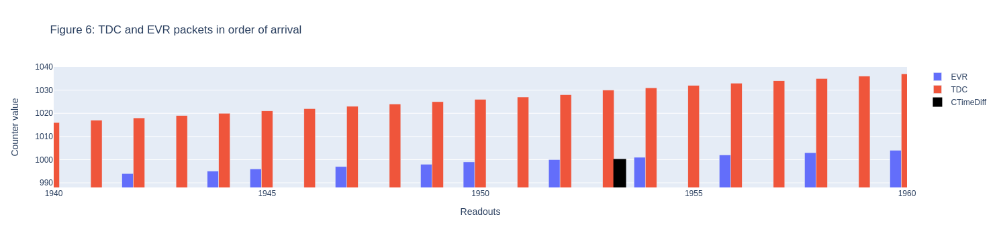

In [22]:
fig6.update_layout(go.Layout(xaxis=dict(autorange=False, range=[1940, 1960]),
                           yaxis=dict(autorange=False, range=[988, 1040])))
fig6.show()

## Possible Time syncronization

Since the syncronization through counter's are not feasible, the following algorithm could be used to find out TDC pair for each EVR frame:

1. Catch next incoming packet with TDC or EVR frame inside.
1. Start to wait for a pair with a waiting time of frequency/2 in our case 50ms


* If the other pair arrives we store the TDC or EVR as a pair to the current event
* If there is not pair found, we can estimate the clock time from previous frames and the repetition frequency

### Paring with counter sync
According to this I analysed the currently recorded dataset and paired those TDC and EVR frames where the packet arrival difference was **<50ms**.  The following figure for each EVR Readout shows the paired TDC and by this the result of the paring mechanism when the counter are still in sync. The **black** column means those **EVR which we do not found any TDC pair because of packet loss**.

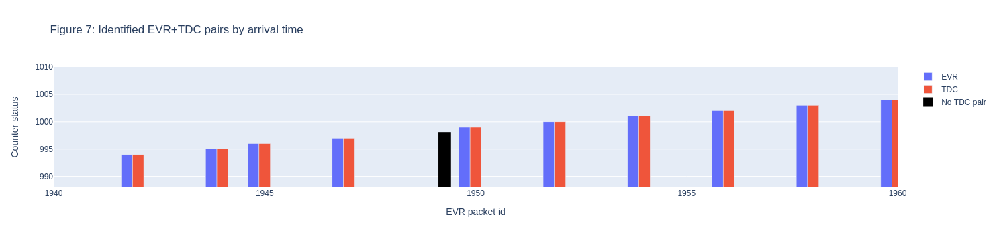

In [23]:
fig7.update_layout(go.Layout(xaxis=dict(autorange=False, range=[1940, 1960]),
                           yaxis=dict(autorange=False, range=[988, 1010])))
fig7.show()

### Paring during TDC counter reset

The figure below shows the paring still working even when TDC counter reseted. However at this moment we have a bit more frequent TDC packet loss.

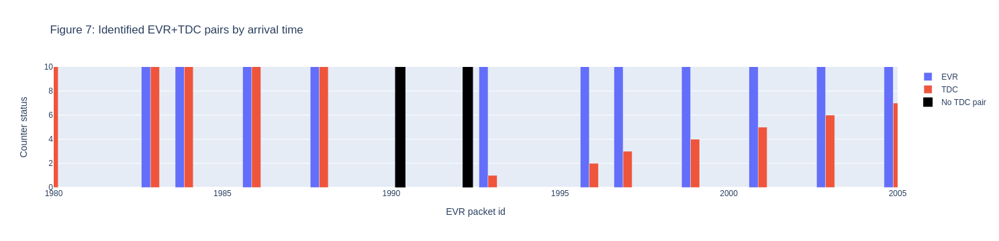

In [24]:
fig7.update_layout(go.Layout(xaxis=dict(autorange=False, range=[1980, 2005]),
                           yaxis=dict(autorange=False, range=[0, 10])))
fig7.show()

### TDC frame delay

The next figure shows the distribution of the TDC frame delays compared to their EVR pair. According to the statistic is more like that the TDC will come a 0-0.7 ms later then the EVR, but there are a siggnificant number of cases when it was before with 0-0.25ms.

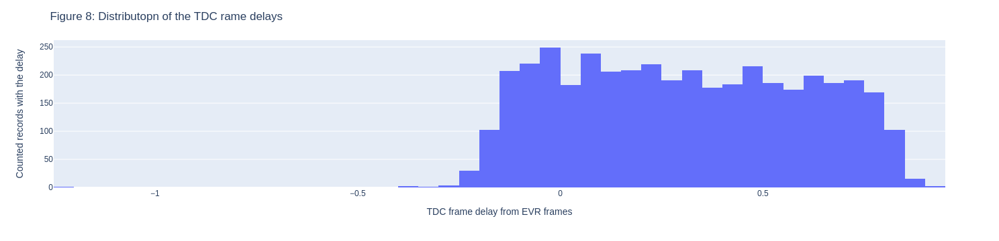

In [25]:
fig8.show()